# Задание на практику

In [1]:
import requests
import urllib
import os
import numpy as np

In [2]:
import pandas as pd
import numpy as np
import scipy
import json

import open3d as o3d

from tqdm import tqdm
import os

from typing import List, Dict,Tuple,Any

import catboost
from catboost import CatBoostClassifier, Pool

from sklearn.model_selection import StratifiedGroupKFold
from sklearn.model_selection import train_test_split,KFold,GroupKFold,StratifiedGroupKFold,StratifiedKFold

import plotly.graph_objects as go
from plotly.subplots import make_subplots

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


# Описание практического задания
<img src="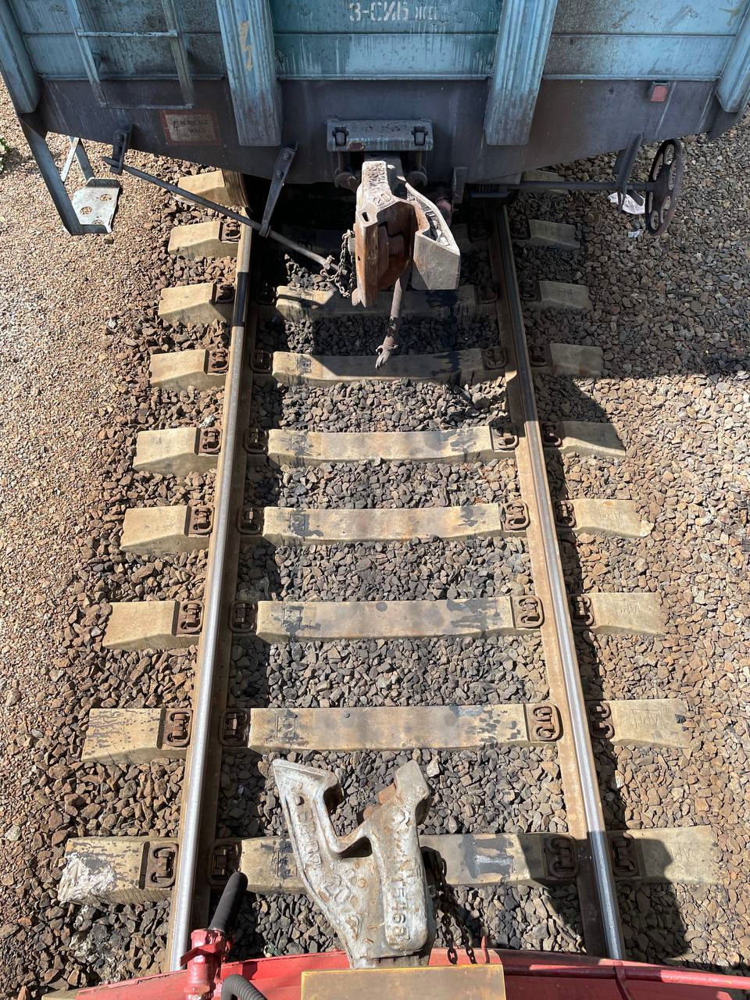

В рамках данного практического задания вам необходимо решить задачу сегментации облака точек сцепки на наборе данных NIIAS с использованием классического подхода. Задание разделено на следующий набор шагов :
<br />
***
**Шаг 1.** Определение имен классов в наборе данных
<br />
***
**Шаг 2.** Реализация класса формирующего набор данных для обучения
<br />
***
**Шаг 3.** Реализация функции для визуализации полученного набора данных
<br />
***
**Шаг 4.** Реализация класса для обучения и тестирования модели
<br />
***
**Шаг 5.** Обучение модели и эксперименты, достижение начальных значений метрик
<br />
***
**Шаг 6.** Улучшение кода засчет самостоятельно выбранных подходов с целью достижения максимальных метрик качества
<br />
***

# Реализация домашнего задания.
## Базовый подход:
В рамках шаблона для реализации Шаг 2 - Шаг 5 сформирован заранее подготовленный набор функций, где вашей задачей является имплементация согласно описанию перед каждым из шагов. Вы можете следовать этим шагам для выполнения домашнего задания. **На шаге 6 предполагается внесение своих модификаций в програмнный код**

## Альтернативный подход.
Вы можете не пользоваться подготовленным шаблоном, а сразу с шага 2 писать собственный код. Основная задача - **получить требуемые уровни метрик**(шаг 5 и 6),**реализовать визуализацию**(шаг 3), а также **в вашем коде должен содержаться алгоритм для подсчета признаков из шага 2**(вы можете его дополнить, при желании закомментировать ненужные признаки, но реализация в коде должна быть)

# Подсчет метрик
В рамках требуемого для имплементации на шаге 4 класса используется библиотека Catboost(https://catboost.ai/) , в качестве метрики - **Weighted F1**(https://catboost.ai/en/docs/concepts/loss-functions-multiclassification#F1).
<br />
<br />
При реализации кода самостоятельно **идентичной метрикой не привязанной к Catboost** является реализация в библиотеке sklearn (https://scikit-learn.org/stable/modules/generated/sklearn.metrics.f1_score.html) , во время инициализации в конструктор нужно передать значение 'weighted' в переменную 'average'





## Реализация датасета для загрузки данных


***
В рамках данного задания необходимо реализовать класс, функции которого выполняют следующие пунткы
***
**1. Загрузка данных облака точек из файла**:
<br />
  Функция - read_points_from_file
***
**2. Загрузка данных о всех сценах содержащихся в наборе данных**:
<br />
  Функция - load_from_directory
***
**3. Создание k-d дерева из облака точек**:
<br />
  Функция - create_kdtree
Для знакомства с API Open3d обратитесь к следующему материалу:
https://www.open3d.org/docs/latest/tutorial/Basic/kdtree.html
***
**4. Поиск k соседей для каждой точки из k-d дерева**:
<br />
  Функция - knn
Для знакомства с API Open3d обратитесь к следующему материалу:
https://www.open3d.org/docs/latest/python_api/open3d.geometry.KDTreeFlann.html
***
**5. Поиск соседей для каждой точки из k-d дерева c использованием метода radius search**:
<br />
  Функция - radius_search
Для знакомства с API Open3d обратитесь к следующему материалу:
https://www.open3d.org/docs/latest/python_api/open3d.geometry.KDTreeFlann.html
***
**5. Вычисление признаков на базе собственных значений найденного облака соседних точек**:
<br />
**5.1 На первом шаге необходимо вычислить собственные значения для облака соседних точек** :
$$
cov_{x,y,z}=\frac{\sum_{i=1}^{N}(x_{i}-\bar{x})(y_{i}-\bar{y})(z_{i}-\bar{z})}{N-1}
$$
Для вычислений можно воспользоваться:
Open3d (compute_mean_and_covariance) или Numpy (np.cov) для подсчета матрицы ковариации;
<br />


**5.2 Далее нужно вычислить собственные значения матрицы ковариации** :
<br />
Для вычислений можно воспользоваться:
Numpy (np.linalg.eig) или Scipy (scipy.linalg.eig) для нахождения собственных векторов и чисел.
<br />

Важно - итоговые собственные числа должны иметь следующий порядок:
$$
e_{1}\geq e_{2}\geq e_{3}\geq 0
$$
Для того чтобы избежать NAN и отрицательных значений:
1. Использовать в качестве облака точек набор из 3 и более точек
2. Делать clip в случае, если число меньше 0 (чаще всего отрицательные значения обусловленных численной стабильностью при вычислении)
3. В случае, если в формуле присутствует деление на одно из собственных чисел или есть выражение log(e_i), то к значению собственного числа необходимо прибавить минимальную положительную константу (например 1e-6) для избежания деления на 0 и ошибок при подсчете логарифма

После получения собственных значений можной переходить к шагу 5.3 - вычисление признаков

**5.3 В качестве признаков необходимо использовать следующие формулы**:
$$
\text{Linearity} = \frac{e_{1} - e_{2}}{e_{3}}\\
\text{Planarity} = \frac{e_{2} - e_{3}}{e_{1}}\\
\text{Scattering} = \frac{e_{3}}{e_{1}}\\
\text{Omnivariance} = 3\sqrt{e_{1}e_{2}e_{3}}\\
\text{Anisotropy} = \frac{e_{1} - e_{3}}{e_{1}}\\
\text{Eigentropy} = -\sum^3_{i=1}(\frac{e_{i}}{\sum e_{i}} - \ln{\frac{e_{i}}{\sum e_{i}}})\\
\text{Sum of eigenvalues} = e_{1} + e_{2} + e_{3}\\
\text{Change of curvative} = \frac{e_{1} - e_{3}}{e_{1}}\\
$$

Для уточнения деталей по их вычислению, и других дополнительных тонкостей можно обратиться к следующему материалу: https://mediatum.ub.tum.de/doc/800632/941254.pdf(глава 4.3. Surface Normals and Curvature Estimates)
***
**6. Применение ранее имплементированных функций в рамках функции create_dataset**:
Данная функция на выходе должна возвращать обьект pd.DataFrame с полями согласно переменной self.feature_names




In [ ]:
class PointCloudDataset(object):
    def __init__(self,data_path: str,grouping_method: str,neighbourhood_th: Any):
        """
        In :
            data_path: str - путь до папки с данными
            grouping_method : str - метод поиска соседей , ["knn","radius_search",имплементированный вами]
            neighbourhood_th : Any[int,float] - пороговое значение для k - количества соседей или radius - радиуса сферы
        """

        self.data_path = data_path
        self.grouping_method = grouping_method
        self.neighbourhood_th = neighbourhood_th
        self.epsilon = 1e-8

        self.roi = [0.7, 1.4, 0, 10, -5, 5]

        self.feature_names = ['x', 'y', 'z', 'eigenvals_sum', 'linearity', 'planarity', 'change_of_curvature',
                              'scattering', 'omnivariance', 'anisotropy', 'eigenentropy', 'label','scene_id']

    def read_points_from_file(self, filename: str) -> np.ndarray:
        """Считывает облако точек из текстового файла."""
        with open(filename, "r") as txt_points:
            str_points = txt_points.readlines()
        points = []
        for i in range(11, len(str_points)):
            pnt_data = str_points[i].split()
            pnt_x, pnt_y, pnt_z = float(pnt_data[0]), float(pnt_data[1]), float(pnt_data[2])
            points.append([pnt_x, pnt_y, pnt_z])
        return np.array(points)

    def filter_by_roi(self,cloud):
        min_z, max_z, min_x, max_x, min_y, max_y = self.roi
        cloud = np.array(cloud)
        for i, axis_range in enumerate([[min_x,max_x],
                                        [min_y,max_y],
                                        [min_z,max_z]]):
            low_b, high_b = axis_range
            cloud = cloud[cloud[:, i] < high_b]
            cloud = cloud[cloud[:, i] > low_b]

        return cloud

    def load_annotation(self, cloud: np.ndarray, filename: str) -> np.ndarray:
        """Загружает аннотацию и присваивает метки точкам."""
        with open(filename, "r") as fp:
            json_data = json.load(fp)
        labels = np.zeros((cloud.shape[0], 1), dtype=int)
        if json_data.get("figures"):
            for figure in json_data["figures"]:
                geom = figure["geometry"]
                pos = geom["position"]
                dim = geom["dimensions"]
                center = np.array([pos['x'], pos['y'], pos['z']])
                dimensions = np.array([dim['x'], dim['y'], dim['z']])
                min_bound = center - dimensions / 2
                max_bound = center + dimensions / 2
                in_box_mask = np.all((cloud >= min_bound) & (cloud <= max_bound), axis=1)
                labels[in_box_mask] = 1
        return labels

    def load_from_directory(self, directory: str) -> Tuple[List[np.ndarray],List[np.ndarray]]:
        """Загружает все сцены и их аннотации из указанной директории."""
        all_points = []
        all_labels = []
        scenes = sorted([d for d in os.listdir(directory) if os.path.isdir(os.path.join(directory, d))])
        for dataset in scenes:
            ann_path = os.path.join(directory, dataset, "ann")
            points_path = os.path.join(directory, dataset, "pointcloud")
            if not os.path.exists(points_path): continue

            files = sorted(os.listdir(points_path))
            for point_cloud_file in files:
                point_cloud_path = os.path.join(points_path, point_cloud_file)
                ann_file_path = os.path.join(ann_path, point_cloud_file + ".json")

                points = self.read_points_from_file(point_cloud_path)
                if os.path.exists(ann_file_path):
                    labels = self.load_annotation(points, ann_file_path)
                    all_points.append(np.array(points))
                    all_labels.append(labels)

        return all_points, all_labels

    def create_kdtree(self, points :np.ndarray)-> Tuple[o3d.geometry.PointCloud,o3d.geometry.KDTreeFlann]:
        pcd = o3d.geometry.PointCloud()
        pcd.points = o3d.utility.Vector3dVector(points)
        tree = o3d.geometry.KDTreeFlann(pcd)
        return pcd, tree

    def knn(self, pcd: o3d.geometry.PointCloud, tree: o3d.geometry.KDTreeFlann, query_index : int, k: int) -> np.ndarray:
        [_, indices, _] = tree.search_knn_vector_3d(pcd.points[query_index], k)
        return np.asarray(pcd.points)[indices]

    def radius_search(self, pcd: o3d.geometry.PointCloud, tree: o3d.geometry.KDTreeFlann, query_index : int, radius: float) -> np.ndarray:
        [_, indices, _] = tree.search_radius_vector_3d(pcd.points[query_index], radius)
        return np.asarray(pcd.points)[indices]

    def get_eugen_stats(self, neighbourhood_points: np.ndarray) -> Tuple[float, ...]:
        if neighbourhood_points.shape[0] < 3:
            return (0.0,) * 8

        cov_matrix = np.cov(neighbourhood_points.T)

        eigenvalues = np.linalg.eigvalsh(cov_matrix)
        eigenvalues = np.sort(eigenvalues)[::-1]
        e1, e2, e3 = eigenvalues


        sum_of_eigenvalues = e1 + e2 + e3
        linearity = (e1 - e2) / (e1 + self.epsilon)
        planarity = (e2 - e3) / (e1 + self.epsilon)
        scattering = e3 / (e1 + self.epsilon)
        omnivariance = (e1 * e2 * e3) ** (1/3)
        anisotropy = (e1 - e3) / (e1 + self.epsilon)
        p = eigenvalues / (sum_of_eigenvalues + self.epsilon)
        eigenentropy = -np.sum(p * np.log(p + self.epsilon))
        change_of_curvature = e3 / (sum_of_eigenvalues + self.epsilon)

        return (sum_of_eigenvalues, linearity, planarity, change_of_curvature,
                scattering, omnivariance, anisotropy, eigenentropy)

    def create_dataset(self) -> pd.DataFrame:
        all_points, all_labels = self.load_from_directory(self.data_path)
        dataset_rows = []

        for scene_id, (points, labels) in enumerate(tqdm(zip(all_points, all_labels), total=len(all_points), desc="Processing Scenes")):
            pcd, tree = self.create_kdtree(points)
            
            for i in range(len(pcd.points)):
                if self.grouping_method == 'knn':
                    neighbours = self.knn(pcd, tree, i, self.neighbourhood_th)
                elif self.grouping_method == 'radius_search':
                    neighbours = self.radius_search(pcd, tree, i, self.neighbourhood_th)
                else:
                    raise ValueError("Unknown grouping method specified.")
                
                features = self.get_eugen_stats(neighbours)

                point_coords = points[i]
                label = labels[i][0]
                row = [
                    point_coords[0], point_coords[1], point_coords[2],
                    *features,
                    label,
                    scene_id
                ]
                dataset_rows.append(row)
        
        dataframe = pd.DataFrame(dataset_rows, columns=self.feature_names)
        return dataframe

### Получим тренировочный набор данных

In [ ]:
train_data_path = "C:/Users/PC/Documents/university/AI/PointCloudProject/data/training"
method = 'knn'
neighbourhood_th = 15
print("Собираем тренировочный датасет...")
train_dataset = PointCloudDataset(train_data_path, method, neighbourhood_th)
train_dataframe = train_dataset.create_dataset()

train_dataframe.to_csv('processed_train_data.csv', index=False)
print("Тренировочный датафрейм сохранен в processed_train_data.csv")

print("Готово.")
print("Размер тренировочного DataFrame:", train_dataframe.shape)
print("Распределение классов:\n", train_dataframe['label'].value_counts(normalize=True))

Собираем тренировочный датасет...


Processing Scenes:   3%|▎         | 17/513 [00:44<22:41,  2.75s/it]C:\Users\PC\AppData\Local\Temp\ipykernel_20416\485427946.py:141: RuntimeWarning: invalid value encountered in scalar power
  omnivariance = (e1 * e2 * e3) ** (1/3)
Processing Scenes: 100%|██████████| 513/513 [21:33<00:00,  2.52s/it]


Тренировочный датафрейм сохранен в processed_train_data.csv
Готово.
Размер тренировочного DataFrame: (12333408, 13)
Распределение классов:
 label
0    0.987952
1    0.012048
Name: proportion, dtype: float64


### Получим тестовый набор данных

In [ ]:
test_data_path = "C:/Users/PC/Documents/university/AI/PointCloudProject/data/testing"
method = 'knn'
neighbourhood_th = 15
print("\nСобираем тестовый датасет...")
test_dataset = PointCloudDataset(test_data_path, method, neighbourhood_th)
test_dataframe = test_dataset.create_dataset()

test_dataframe.to_csv('processed_test_data.csv', index=False)
print("Тестовый датафрейм сохранен в processed_test_data.csv")

print("Готово.")
print("Размер тестового DataFrame:", test_dataframe.shape)
print("Распределение классов:\n", test_dataframe['label'].value_counts(normalize=True))


Собираем тестовый датасет...


Processing Scenes: 100%|██████████| 76/76 [03:16<00:00,  2.58s/it]


Тестовый датафрейм сохранен в processed_test_data.csv
Готово.
Размер тестового DataFrame: (1827360, 13)
Распределение классов:
 label
0    0.981775
1    0.018225
Name: proportion, dtype: float64


## Реализация функции для загрузки данных (5 баллов)
### Ожидаемый результат:
Тестовые данные(scene_id == 0) :

<img src="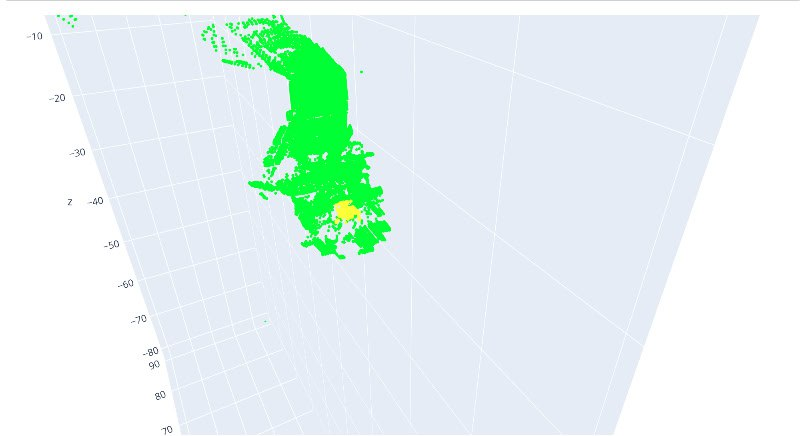

In [ ]:

color_map = {
      0: (0, 1, 0),      
      1: (1, 1, 0),      
    }



def visualize_point_cloud(points: np.ndarray, colors: list) -> go.Figure:
    """
    TODO ЗАПОЛНЕНО: Визуализирует облако точек с помощью Plotly.
    """
    fig = go.Figure(data=[go.Scatter3d(
        x=points[:, 0],
        y=points[:, 1],
        z=points[:, 2],
        mode='markers',
        marker=dict(
            size=2,          
            color=colors,    
            opacity=0.8
        )
    )])
    fig.update_layout(
        title="Визуализация облака точек",
        scene=dict(
            xaxis_title='X (ось движения)',
            yaxis_title='Y (поперечная ось)',
            zaxis_title='Z (вертикальная ось)',
            aspectmode='data'
        ),
        margin=dict(r=0, b=0, l=0, t=40)
    )
    return fig

### Визуализируем тестовые данные

In [7]:
scene_0 = test_dataframe[test_dataframe["scene_id"] == 0]
points  = scene_0.to_numpy()[:,:3]
labels = scene_0['label'].astype(int)
colors = [color_map.get(label, 'grey') for label in labels]
fig = visualize_point_cloud(points, colors)
fig.update_layout(title="Пример сцены из тестового набора (Ground Truth)")
fig.show()

In [16]:
if 550 in train_dataframe["scene_id"].unique():
    scene_id_to_show = 550
else:
    scene_id_to_show = train_dataframe["scene_id"].unique()[0]

scene_1 = train_dataframe[train_dataframe["scene_id"] == scene_id_to_show]
points  = scene_1.to_numpy()[:,:3]
labels = scene_1['label'].astype(int)
colors = [color_map.get(label, 'grey') for label in labels]
fig = visualize_point_cloud(points, colors)
fig.update_layout(title=f"Пример сцены {scene_id_to_show} из тренировочного набора (Ground Truth)")
fig.show()

### Визуализируем сцену из тренировочных данных

## Реализация класса Trainer для обучения и тестирования модели (15 баллов)


В рамках данного задания необходимо реализовать класс, функции которого выполняют следующие пункты
***
**1. Разбиение тренировочных данных на n фолдов**:
<br />
  Функция - create_folds
  В данной функции можно выбрать один из методов from sklearn.model_selection
***
**2. Реализация функции для тренировки модели**:
<br />
  Функция - train_catboost
Для знакомства с API Catboost (https://catboost.ai/en/docs/concepts/python-reference_catboost_fit)
***
**3. Реализация функции для проверки модели на тестовых данных**:
<br />
  Функция - test_catboost
API Catboost - eval_metrics (https://catboost.ai/en/docs/concepts/python-reference_catboost_fit)
***
**4. Реализация функции для обучения и тестирования модели на n фолдах**:
<br />
  Функция - fit
***
**5. Реализация функции получения лучшей по качеству на test модели**:
<br />
  Функция - return_best
***




In [ ]:
class Trainer(object):
    def __init__(self,train_data: pd.DataFrame, test_data: pd.DataFrame, model_config: Dict, n_folds: int):
        self.model_params = model_config
        self.n_folds = n_folds
        self.train_data = train_data
        self.test_data = test_data
        self.metrics = ['TotalF1:average=Weighted', 'Accuracy']
        self.folds = self.create_folds()
        self.models_list = []
        self.f1_list = []
        self.acc_list = []

    def create_folds(self) -> List[List[np.ndarray]]:

        groups = self.train_data['scene_id']
        y = self.train_data['label']

        sgkf = StratifiedGroupKFold(n_splits=self.n_folds, shuffle=True, random_state=42)
        kfold_dset_index = list(sgkf.split(self.train_data, y, groups))

        print(f"Используется StratifiedGroupKFold. Создано {len(kfold_dset_index)} фолдов.")
        return kfold_dset_index

    def train_catboost(self, train_pool: catboost.Pool, val_pool: catboost.Pool) -> catboost.CatBoostClassifier:
        model = CatBoostClassifier(**self.model_params)
        model.fit(
            train_pool,
            eval_set=val_pool,
        )
        return model

    def test_catboost(self, test_pool: catboost.Pool, catboost_model:catboost.CatBoostClassifier) -> List[float]:
        metric_results = catboost_model.eval_metrics(
            data=test_pool,
            metrics=self.metrics
        )
        f1_score = metric_results[self.metrics[0]][-1]
        accuracy = metric_results[self.metrics[1]][-1]
        return [f1_score, accuracy]

    def fit(self):
        X = self.train_data.drop(columns=["label", "scene_id"])
        y = self.train_data['label']
        X_test = self.test_data.drop(columns=["label", "scene_id"])
        y_test = self.test_data['label']

        for fold, (train_idx, val_idx) in enumerate(tqdm(self.folds, desc="Training on Folds")):
            print(f"\n--- Fold {fold+1}/{self.n_folds} ---")
            
            X_train, y_train = X.iloc[train_idx], y.iloc[train_idx]
            X_val, y_val = X.iloc[val_idx], y.iloc[val_idx]

            train_pool = Pool(data=X_train, label=y_train)
            val_pool = Pool(data=X_val, label=y_val)

            print("Training model...")
            catboost_model = self.train_catboost(train_pool, val_pool)

            print("Evaluating model...")
            test_pool = Pool(data=X_test, label=y_test)
            
            f1, acc = self.test_catboost(test_pool, catboost_model)
            print(f"Fold {fold+1} Test Metrics: F1={f1:.4f}, Accuracy={acc:.4f}")

            self.f1_list.append(f1)
            self.acc_list.append(acc)
            self.models_list.append(catboost_model)

            del X_train,y_train,X_val,y_val,train_pool,val_pool,test_pool,catboost_model

        print('\n================================')
        print(f"Average F1       = {np.mean(self.f1_list):.4f} +/- {np.std(self.f1_list):.4f}")
        print(f"Average Accuracy = {np.mean(self.acc_list):.4f} +/- {np.std(self.acc_list):.4f}")
        print('================================\n')

    def return_best(self):
        if not self.f1_list:
            raise RuntimeError("Модель еще не обучена. Вызовите .fit() сначала.")
        
        best_f1_index = np.argmax(self.f1_list)
        print(f"Лучшая модель из фолда {best_f1_index + 1} с F1-score: {self.f1_list[best_f1_index]:.4f}")
        
        model = self.models_list[best_f1_index]
        return model

### Обучим модель на n фолдах

In [ ]:
params = {
    'iterations': 1000,
    'learning_rate': 0.1,
    'depth': 6,
    'loss_function': 'MultiClass',
    'eval_metric': 'TotalF1:average=Weighted',
    'verbose': False, 
    'random_seed': 42,
    'allow_writing_files': False,
    'early_stopping_rounds': 50 
}
n_folds = 5 

trainer = Trainer(train_dataframe,test_dataframe,params,n_folds)
trainer.fit()

Используется StratifiedGroupKFold. Создано 5 фолдов.


Training on Folds:   0%|          | 0/5 [00:00<?, ?it/s]


--- Fold 1/5 ---
Training model...
Evaluating model...


Training on Folds:  20%|██        | 1/5 [53:40<3:34:42, 3220.58s/it]

Fold 1 Test Metrics: F1=0.9973, Accuracy=0.9974

--- Fold 2/5 ---
Training model...
Evaluating model...


Training on Folds:  40%|████      | 2/5 [1:34:20<2:18:04, 2761.64s/it]

Fold 2 Test Metrics: F1=0.9972, Accuracy=0.9973

--- Fold 3/5 ---
Training model...
Evaluating model...


Training on Folds:  60%|██████    | 3/5 [1:52:32<1:06:38, 1999.20s/it]

Fold 3 Test Metrics: F1=0.9975, Accuracy=0.9975

--- Fold 4/5 ---
Training model...
Evaluating model...


Training on Folds:  80%|████████  | 4/5 [2:10:41<27:19, 1639.73s/it]  

Fold 4 Test Metrics: F1=0.9976, Accuracy=0.9977

--- Fold 5/5 ---
Training model...
Evaluating model...


Training on Folds: 100%|██████████| 5/5 [2:23:28<00:00, 1721.61s/it]

Fold 5 Test Metrics: F1=0.9976, Accuracy=0.9976

Average F1       = 0.9974 +/- 0.0001
Average Accuracy = 0.9975 +/- 0.0001



### Получим наилучшую модель

In [11]:
print("Выбираем и сохраняем лучшую модель...")
best_model = trainer.return_best()
model_save_path = "best_hitch_detection_model.cbm"
best_model.save_model(model_save_path)
print(f"Лучшая модель успешно сохранена в файл: {model_save_path}")

Выбираем и сохраняем лучшую модель...
Лучшая модель из фолда 4 с F1-score: 0.9976
Лучшая модель успешно сохранена в файл: best_hitch_detection_model.cbm


### Получим предсказание для одной сцены тестового набора данных

In [ ]:
scene_to_show_id = 0
scene = test_dataframe[test_dataframe["scene_id"] == scene_to_show_id]

X_test_scene = scene.drop(columns=["label","scene_id"])
y_test_scene = scene['label']

y_pred_scene = best_model.predict(X_test_scene)


### Визуализируем тестовые данные с оригинальными лейблами

In [13]:
print(f"Визуализация Ground Truth для сцены {scene_to_show_id}")
points_gt  = scene.to_numpy()[:,:3]
labels_gt = scene['label'].astype(int)
colors_gt = [color_map.get(label, 'grey') for label in labels_gt]

fig_gt = visualize_point_cloud(points_gt, colors_gt)
fig_gt.update_layout(title=f'Истинные метки (Ground Truth) для Сцены {scene_to_show_id}')
fig_gt.show()

Визуализация Ground Truth для сцены 0


### Визуализируем тестовые данные с предсказанными лейблами

In [ ]:
print(f"\nВизуализация предсказаний для сцены {scene_to_show_id}")
points_pred  = scene.to_numpy()[:,:3]
labels_pred = y_pred_scene.flatten().astype(int)
colors_pred = [color_map.get(label, 'grey') for label in labels_pred]

fig_pred = visualize_point_cloud(points_pred, colors_pred)
fig_pred.update_layout(title=f'Предсказанные метки (Predictions) для Сцены {scene_to_show_id}')
fig_pred.show()


Визуализация предсказаний для сцены 0


## Улучшение качества предсказания
В рамках этого пункта можно воспользоваться следующими идеями
1. Использование muliscale подхода — признаковое описание точки формируется засчет их вычисления на локальных облаках, полученных с использованием нескольких итераций поиска с разными k или radius их их комбинациями (похожий метод описан в https://arxiv.org/abs/1808.00495)
2. Ансамблинг моделей, полученных в процессе обучения на фолдах
3. Исследование признакого пространства — удаление шумных признаков
4. Исследование пространства данных — работа с выбросами
5. Имплементация других признаков описанных в рамках cтатей:
  1. https://www.researchgate.net/publication/264089430_Semantic_3D_scene_interpretation_A_framework_combining_optimal_neighborhood_size_selection_with_relevant_features
  2. https://isprs-annals.copernicus.org/articles/III-3/177/2016/isprs-annals-III-3-177-2016.pdf

6. Использование class_weights(https://scikit-learn.org/stable/modules/generated/sklearn.utils.class_weight.compute_class_weight.html) и oversampling(https://imbalanced-learn.org/stable/over_sampling.html) для снижения диcбаланса классов
7. Аугментация данных(https://github.com/aksuko/PointCloudAugmentation)
8. Создание полусинтетических сцен с вставленными объектами классов с маленьким количеством точек(https://github.com/ctu-vras/pcl-augmentation)
9. Ваши идеи!